In [1]:
!gpustat

blade                Wed Jul 21 14:43:32 2021  455.45.01
[0] RTX A6000        | 81'C, 100 % | 46482 / 48685 MB | sifanw(46479M)
[1] RTX A6000        | 80'C, 100 % | 46642 / 48685 MB | sifanw(46631M)
[2] RTX A6000        | 30'C,   0 % |     1 / 48685 MB |
[3] RTX A6000        | 26'C,   0 % |     1 / 48685 MB |
[4] RTX A6000        | 27'C,   0 % |     1 / 48685 MB |
[5] RTX A6000        | 25'C,   0 % | 44900 / 48685 MB | wangh19(44897M)
[6] RTX A6000        | 66'C, 100 % |     1 / 48685 MB |
[7] RTX A6000        | 26'C,   0 % |     1 / 48685 MB |


In [2]:
!ls image_regression

Archive
cookie_1.jpg
cookie_3.jpg
cookie_3_regularized_0.0e+00_train_result_256_0.1.pdf
cookie.jpg
cookie_not_regularized_train_result_256_0.1.pdf
cookie_regularized_0.0e+00_train_result_256_0.1.pdf
cookie_regularized_train_result_256_0.1_gray.pdf
cookie_regularized_train_result_256_0.1.pdf
cookie_train_result_2048_0.1_color.pdf
firework.JPG
firework_regularized_train_result_256_0.1.pdf
firework_train_result_2048_0.1_color.pdf
firework_train_result_256_0.1_color.pdf
firework_unweighted_train_result_256_0.1.pdf
frog_1.jpg
frog_colored.jpg
printed_chinese_character.jpg
regularized
river_south_leather_factory.jpg
river_south_leather_factory_regularized_0.0e+00_train_result_256_0.1.pdf
river_south_leather_factory_regularized_1.0e-06_train_result_256_0.1.pdf
yulingling.JPG
yu_lin_ling_2.jpg
yu_lin_ling_2_regularized_1.0e-05_train_result_only_256_0.1.pdf


In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "6"

In [4]:
import numpy as onp
from numpy import fft
import jax.numpy as np
from jax import random, grad, vmap, jit, lax
from jax.experimental import optimizers
from jax.experimental.optimizers import make_schedule
from jax.experimental.ode import odeint
from jax.nn import relu, leaky_relu, swish, sigmoid
from jax.config import config

import itertools
from functools import partial
from torch.utils import data
from tqdm import trange
import matplotlib.pyplot as plt
from matplotlib import image
from scipy.interpolate import griddata

from jax import jacobian, eval_shape
from jax.tree_util import tree_map, tree_multimap, tree_reduce 
from jax.flatten_util import ravel_pytree
from jax.ops import index_update, index

from jaxpinns.optimizers import mdmm_adam

import neural_tangents as nt
import operator

from jax.scipy.stats.norm import logpdf, pdf


from tqdm import trange, tqdm

import time
%matplotlib inline
from IPython.display import clear_output

In [5]:
source_path = 'image_regression/'
save_path = 'image_regression/regularized/color_scan/'

In [6]:
plt.rcParams.update(plt.rcParamsDefault)
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 16,
                        'lines.linewidth': 2,
                        'axes.labelsize': 10,
                        'axes.titlesize': 16,
                        'xtick.labelsize': 10,
                        'ytick.labelsize': 10,
                        'legend.fontsize': 10,
                        'axes.linewidth': 2})

In [7]:
from helpers import *
from regularized_image_regression_helpers import *
def d1_regularization(f):
    def pde(params, x):
        f_r = lambda params, x: f(params, x)[0]
        f_g = lambda params, x: f(params, x)[1]
        f_b = lambda params, x: f(params, x)[2]
        return np.array([grad(f_r, argnums = 1)(params, x), grad(f_g, argnums = 1)(params, x),\
                         grad(f_b, argnums = 1)(params, x)])
    return pde

In [9]:
key = random.PRNGKey(int(time.time()*100))

In [10]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], np.array([0.2989, 0.5870, 0.1140])).reshape(rgb.shape[:2] + (1,))
file_name = 'yu_lin_ling_2.jpg'
img = image.imread(source_path + file_name)
Y_raw = np.array(rgb2gray(img))
Y_raw = np.array(img)
# Y_raw = Y_raw[::2][:,::2]
Y_raw.shape

(1461, 1461, 3)

In [11]:
X_raw = np.array(np.meshgrid(np.arange(Y_raw.shape[0]), np.arange(Y_raw.shape[1]))).reshape(2,-1).T

In [12]:
ratio = 0.1
train_idx = random.choice(key, np.arange(X_raw.shape[0]), shape = (int(X_raw.shape[0] * ratio), ), replace = False)

X_train = X_raw[train_idx]
mu_X, sigma_X = X_train.mean(0), X_train.std(0)

Y_train = Y_raw.reshape(-1,Y_raw.shape[-1])[train_idx]
mu_Y, sigma_Y = Y_train.mean(0), Y_train.std(0)
Y_train = (Y_train - mu_Y) / sigma_Y

print(f'Ratio of pixel used: {ratio}')

Ratio of pixel used: 0.1


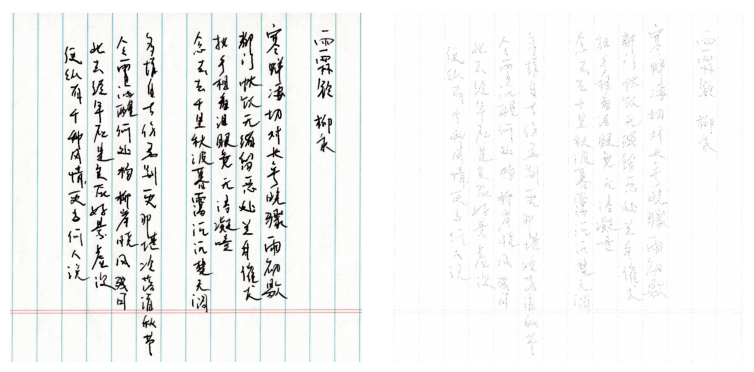

In [13]:
mask = np.zeros(Y_raw.shape).reshape(-1,Y_raw.shape[-1])
mask = index_update(mask, train_idx, 1).reshape(Y_raw.shape)
plt.figure(figsize = (8,4))
plt.subplot(1,2,1)
plt.imshow(Y_raw/255)
plt.axis('off')
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(Y_raw * mask/255 + (1 - mask))
plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

In [15]:
batch_size = 2048
rcs_sampler = residual_sampler(batch_size, Y_raw.shape[0])

In [16]:
# For colored
width = 256
depth = 12
layers = [2, *[width for _ in range(depth)], Y_raw.shape[-1]]

activation = np.tanh
init_model = normInitNet(layers[:-1], activation, mu_X, sigma_X)

In [17]:
lr = 5e-3
init_fn, update_fn, get_params = optimizers.adam(lr)
# init_fn, update_fn, get_params = optimizers.nesterov(lr, 0.9)
lam = 1e-4
@jit
def step(i, state, X):
    key = random.PRNGKey(i)
    g = grad(init_model.regulated_logSineLoss)(get_params(state), init_model.net_init(key), X, lam = lam)
    return update_fn(i, g, state)
print(f'Important: confirm lam {lam} before running!!!!!!!!!!!!!!!')

Important: confirm lam 0.0001 before running!!!!!!!!!!!!!!!


In [18]:
opt_state = init_fn(init_model.scale_params)
init_nIter = 20000
pbar = trange(init_nIter)
scale_stor = []
bias_stor = []

for i in pbar:
    mini_batch = rcs_sampler.sample(random.PRNGKey(i))
    opt_state = step(i, opt_state, mini_batch)
    
    if i % 100 == 0:
        params = get_params(opt_state)
        pbar.set_postfix({'Log sine loss': init_model.logSineLoss(get_params(opt_state), init_model.net_init(random.PRNGKey(i)), mini_batch)})
        scale_stor.append([w for (w, b) in params])
        bias_stor.append([b for (w, b) in params])
        

scale_stor = np.array(scale_stor)
bias_stor = np.array(bias_stor)
        


100%|██████████| 20000/20000 [00:53<00:00, 377.14it/s, Log sine loss=0.012577217] 


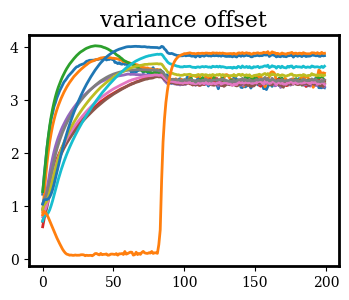

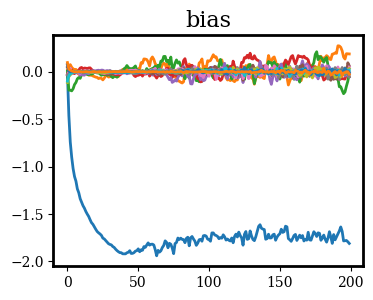

In [19]:
plt.figure(figsize = (4,3))
for i, s in enumerate(scale_stor.T):
    plt.plot(s, label = f'Layer {int(i)}')
# plt.legend()
plt.title('variance offset')
plt.show()
plt.close()

plt.figure(figsize = (4,3))
for i, s in enumerate(bias_stor.T):
    plt.plot(s, label = f'Layer {int(i)}')
# plt.legend()
plt.title('bias')
plt.show()
plt.close()

In [20]:
scale_params = params

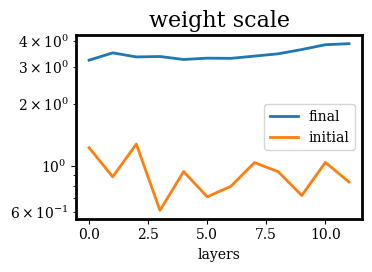

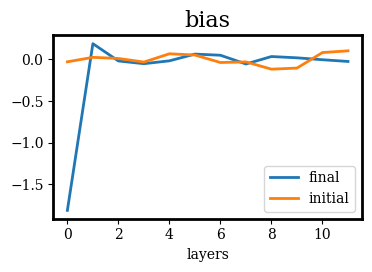

In [21]:
plt.figure(figsize = (4,3))

plt.plot([w_init for w_init, b_init in scale_params], label = 'final')
plt.plot([w_init for w_init, b_init in init_model.scale_params], label = 'initial')

plt.yscale('log')
plt.xlabel('layers')
plt.legend()
plt.title('weight scale')
plt.tight_layout()

plt.show()
plt.close()

plt.figure(figsize = (4,3))

plt.plot([b_init for w_init, b_init in scale_params], label = 'final')
plt.plot([b_init for w_init, b_init in init_model.scale_params], label = 'initial')

plt.xlabel('layers')
plt.legend()
plt.title('bias')
plt.tight_layout()

plt.show()
plt.close()

In [22]:
bcs_sampler = boundary_sampler(batch_size, X_train, Y_train)
fit_model = fitPinns(layers, activation, mu_X, sigma_X, d1_regularization, ())

In [23]:
fit_model.scaled_net_params = parameter_scaling(fit_model.net_params[:-1], scale_params) + [fit_model.net_params[-1]]

In [24]:
key = random.PRNGKey(int(time.time()*100))

In [25]:
# lr = 1e-3
# init_fn, update_fn, get_params = optimizers.nesterov(lr, 0.9)

init_fn, update_fn, get_params = optimizers.adam(optimizers.exponential_decay(1e-4, decay_steps = 1000, decay_rate = 0.99))

In [26]:
nIter = 200000
losses = []

In [27]:
@jit
def step(i, state, batch):
    g1 = grad(fit_model.boundary_loss)(get_params(state), batch[0])

    return update_fn(i, g1, state)

pbar = trange(nIter)
log = 1000
# stack the parameter trees at each leaf node for vmap
init_paramses = tree_multimap(stack_fn, fit_model.net_params, fit_model.scaled_net_params)
opt_state = vmap(init_fn)(init_paramses)
# compile the vmap optimization step
v_step = jit(vmap(step, in_axes = (None, 0, None)))
loss_stor = []

rcs_place_holder = rcs_sampler.sample(key)
for i in pbar:
    key,_ = random.split(key)
    mini_batch = (bcs_sampler.sample(key), rcs_place_holder)
    opt_state = v_step(i, opt_state, mini_batch)
    if i % log == 0:
        params = vmap(get_params)(opt_state)

        bcs_loss = vmap(fit_model.boundary_loss, in_axes = [0, None])(params, mini_batch[0])
        rcs_loss = vmap(fit_model.residual_loss, in_axes = [0, None])(params, mini_batch[1])
        loss_stor.append((bcs_loss, rcs_loss))
        
        pbar.set_postfix({'boundary loss': f'{bcs_loss[0]:.2e} {bcs_loss[1]:.2e}',\
                         'residual loss': f'{rcs_loss[0]:.2e} {rcs_loss[1]:.2e}'})
losses.append(loss_stor) 
        

opt_params = vmap(get_params)(opt_state)
normal_opt_params = tree_map(lambda x: x[0], opt_params)
scaled_opt_params = tree_map(lambda x: x[1], opt_params)

100%|██████████| 200000/200000 [08:15<00:00, 403.30it/s, boundary loss=2.70e-01 1.21e-02, residual loss=2.46e-02 7.52e-02]


In [28]:
normal_pred_img = (fit_model.net_apply(normal_opt_params, X_raw) * sigma_Y + mu_Y).reshape(Y_raw.shape)
scaled_pred_img = (fit_model.net_apply(scaled_opt_params, X_raw) * sigma_Y + mu_Y).reshape(Y_raw.shape)

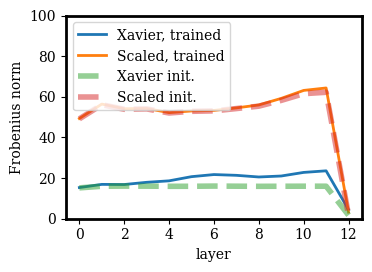

In [29]:
plt.figure(figsize = (4,3))
plt.plot(layer_weight_norm(normal_opt_params), label = 'Xavier, trained')
plt.plot(layer_weight_norm(scaled_opt_params), label = 'Scaled, trained')
plt.plot(layer_weight_norm(fit_model.net_params), linewidth = 4, alpha = 0.5, linestyle = '--', label = 'Xavier init.')
plt.plot(layer_weight_norm(fit_model.scaled_net_params), linewidth = 4, alpha = 0.5, linestyle = '--', label = 'Scaled init.')
plt.legend()
plt.xlabel('layer')
plt.ylabel(r'Frobenius norm')
plt.ylim([0, 100])
plt.tight_layout()
plt.show()
plt.close()

In [30]:

# plt.figure(figsize = (8,4))
# plt.subplot(1,2,1)
# plt.imshow(np.clip(normal_pred_img/255, a_min = 0, a_max = 1), cmap = 'gray')
# plt.axis('off')
# plt.tight_layout()
# plt.subplot(1,2,2)
# plt.imshow(np.clip(scaled_pred_img/255, a_min = 0, a_max = 1), cmap = 'gray')
# plt.axis('off')
# plt.tight_layout()
# plt.show()
# plt.close()

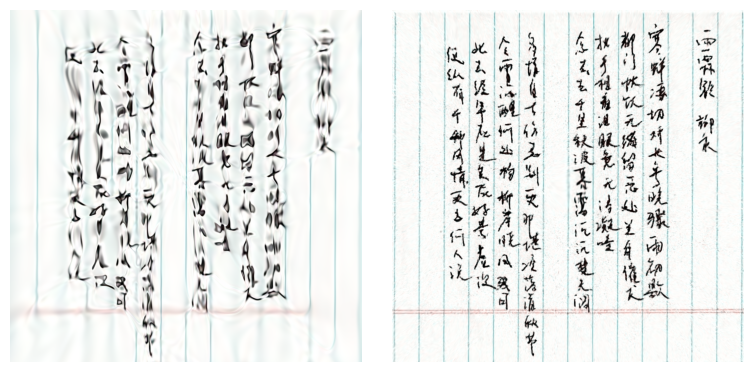

In [31]:

plt.figure(figsize = (8,4))
plt.subplot(1,2,1)
plt.imshow(np.clip(normal_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(np.clip(scaled_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

In [32]:
@jit
def step(i, state, batch, w):
    g1 = grad(fit_model.boundary_loss)(get_params(state), batch[0])
    g2 = grad(fit_model.residual_loss)(get_params(state), batch[1])
    g = tree_multimap(lambda x,y: w[0] * x + y * w[1], g1, g2)
    return update_fn(i, g, state)

pbar = trange(nIter)
# stack the parameter trees at each leaf node for vmap
init_paramses = tree_multimap(stack_fn, fit_model.net_params, fit_model.scaled_net_params)
opt_state = vmap(init_fn)(init_paramses)
# compile the vmap optimization step
v_step = jit(vmap(step, in_axes = (None, 0, None, None)))
loss_stor = []
regularizer = 1e-1
weight = [1., regularizer]
for i in pbar:
    key,_ = random.split(key)
    mini_batch = (bcs_sampler.sample(key), rcs_sampler.sample(key))
    opt_state = v_step(i, opt_state, mini_batch, weight)
    if i % log == 0:
        params = vmap(get_params)(opt_state)

        bcs_loss = vmap(fit_model.boundary_loss, in_axes = [0, None])(params, mini_batch[0])
        rcs_loss = vmap(fit_model.residual_loss, in_axes = [0, None])(params, mini_batch[1])
        loss_stor.append((bcs_loss, rcs_loss))
        
        pbar.set_postfix({'boundary loss': f'{bcs_loss[0]:.2e} {bcs_loss[1]:.2e}',\
                         'residual loss': f'{rcs_loss[0]:.2e} {rcs_loss[1]:.2e}'})
losses.append(loss_stor) 
        
opt_params = vmap(get_params)(opt_state)
regularized_normal_opt_params = tree_map(lambda x: x[0], opt_params)
regularized_scaled_opt_params = tree_map(lambda x: x[1], opt_params)

100%|██████████| 200000/200000 [21:27<00:00, 155.38it/s, boundary loss=2.71e-01 1.50e-02, residual loss=2.67e-02 6.50e-02]


In [33]:
regularized_normal_pred_img = (fit_model.net_apply(regularized_normal_opt_params, X_raw) * sigma_Y + mu_Y).reshape(Y_raw.shape)
regularized_scaled_pred_img = (fit_model.net_apply(regularized_scaled_opt_params, X_raw) * sigma_Y + mu_Y).reshape(Y_raw.shape)

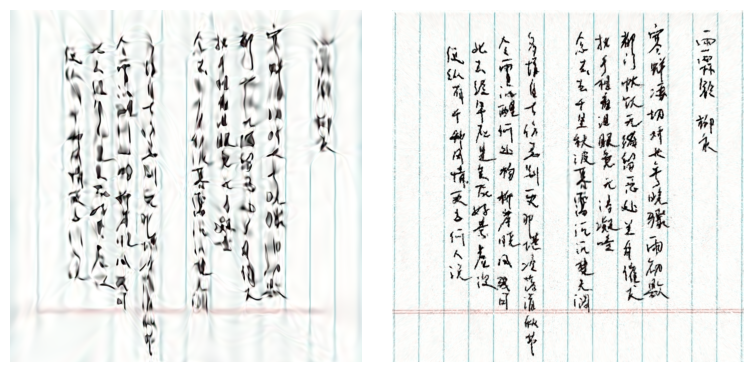

In [35]:

plt.figure(figsize = (8,4))
plt.subplot(1,2,1)
plt.imshow(np.clip(regularized_normal_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(np.clip(regularized_scaled_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

In [36]:
@jit
def step(i, state, batch, w):
    g1 = grad(fit_model.boundary_loss)(get_params(state), batch[0])
    g2 = grad(fit_model.residual_loss)(get_params(state), batch[1])
    g = tree_multimap(lambda x,y: w[0] * x + y * w[1], g1, g2)
    return update_fn(i, g, state)

pbar = trange(nIter)
# stack the parameter trees at each leaf node for vmap
init_paramses = tree_multimap(stack_fn, fit_model.net_params, fit_model.scaled_net_params)
opt_state = vmap(init_fn)(init_paramses)
# compile the vmap optimization step
v_step = jit(vmap(step, in_axes = (None, 0, None, None)))
loss_stor = []
more_regularizer = 10.
weight = [1., more_regularizer]
for i in pbar:
    key,_ = random.split(key)
    mini_batch = (bcs_sampler.sample(key), rcs_sampler.sample(key))
    opt_state = v_step(i, opt_state, mini_batch, weight)
    if i % log == 0:
        params = vmap(get_params)(opt_state)

        bcs_loss = vmap(fit_model.boundary_loss, in_axes = [0, None])(params, mini_batch[0])
        rcs_loss = vmap(fit_model.residual_loss, in_axes = [0, None])(params, mini_batch[1])
        loss_stor.append((bcs_loss, rcs_loss))
        
        pbar.set_postfix({'boundary loss': f'{bcs_loss[0]:.2e} {bcs_loss[1]:.2e}',\
                         'residual loss': f'{rcs_loss[0]:.2e} {rcs_loss[1]:.2e}'})
losses.append(loss_stor) 
        
opt_params = vmap(get_params)(opt_state)
more_regularized_normal_opt_params = tree_map(lambda x: x[0], opt_params)
more_regularized_scaled_opt_params = tree_map(lambda x: x[1], opt_params)

100%|██████████| 200000/200000 [21:26<00:00, 155.41it/s, boundary loss=2.93e-01 9.60e-02, residual loss=3.28e-03 4.36e-03]


In [37]:
more_regularized_normal_pred_img = (fit_model.net_apply(more_regularized_normal_opt_params, X_raw) * sigma_Y + mu_Y).reshape(Y_raw.shape)
more_regularized_scaled_pred_img = (fit_model.net_apply(more_regularized_scaled_opt_params, X_raw) * sigma_Y + mu_Y).reshape(Y_raw.shape)

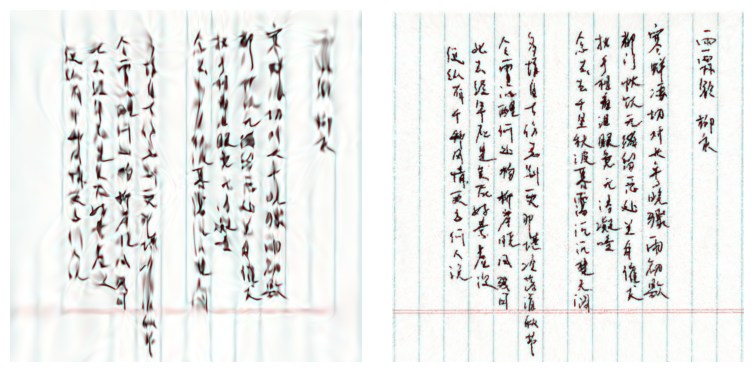

In [39]:

plt.figure(figsize = (8,4))
plt.subplot(1,2,1)
plt.imshow(np.clip(more_regularized_normal_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(np.clip(more_regularized_scaled_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

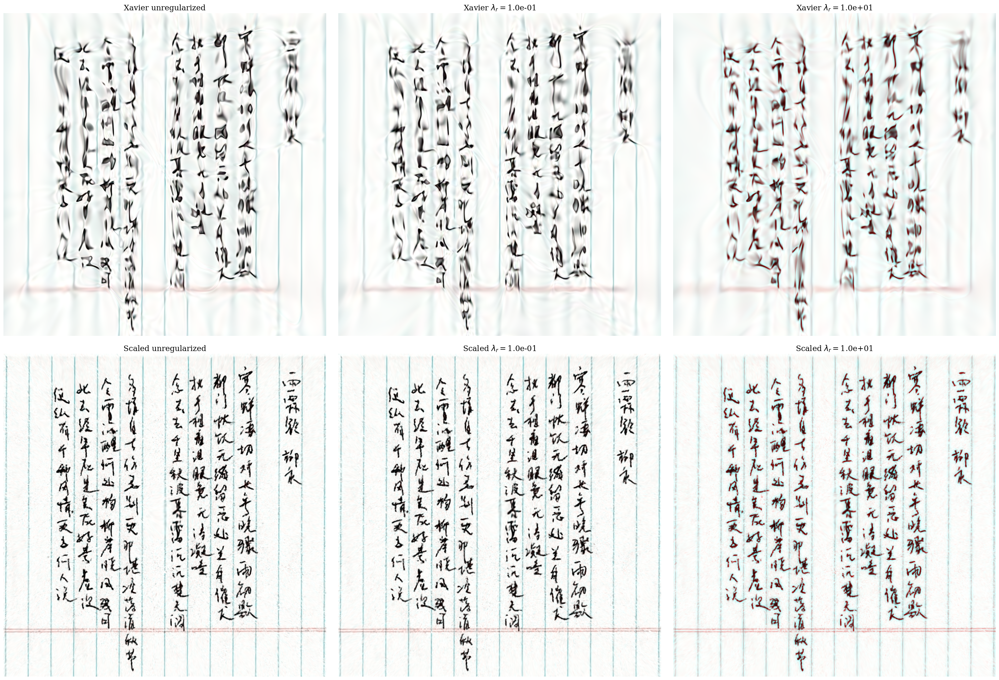

In [41]:
plt.figure(figsize = (30, 20))
plt.subplot(2,3,1)
plt.imshow(np.clip(normal_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.title('Xavier unregularized')
plt.tight_layout()

plt.subplot(2,3,4)
plt.imshow(np.clip(scaled_pred_img/255, a_min = 0, a_max = 1))
plt.title('Scaled unregularized')
plt.axis('off')
plt.tight_layout()

plt.subplot(2,3,2)
plt.imshow(np.clip(regularized_normal_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.title(r'Xavier $\lambda_r = $' + f'{regularizer:.1e}')
plt.tight_layout()


plt.subplot(2,3,5)
plt.imshow(np.clip(regularized_scaled_pred_img/255, a_min = 0, a_max = 1))
plt.title(r'Scaled $\lambda_r = $' + f'{regularizer:.1e}')
plt.axis('off')
plt.tight_layout()

plt.subplot(2,3,3)
plt.imshow(np.clip(more_regularized_normal_pred_img/255, a_min = 0, a_max = 1))
plt.axis('off')
plt.title(r'Xavier $\lambda_r = $' + f'{more_regularizer:.1e}')
plt.tight_layout()


plt.subplot(2,3,6)
plt.imshow(np.clip(more_regularized_scaled_pred_img/255, a_min = 0, a_max = 1))
plt.title(r'Scaled $\lambda_r = $' + f'{more_regularizer:.1e}')
plt.axis('off')
plt.tight_layout()


plt.tight_layout()
plt.savefig(save_path + file_name[:-4] + f'_width_{width}_depth_{depth}_multi_regularized_train_result_only_{batch_size}_{ratio}.pdf', dpi = 300)

plt.show()
plt.close()